# GeoZ Tutorial: Example of using the Voronoi_regions_plot function  
  

This notebook demonstrate the newly implemented function in GeoZ (Voronoi_regions_plot). The function was developed based on the work done in Fang et al., 2024 (https://doi.org/10.1016/j.ejrh.2024.101938). This function was developed to address one of the main weakness in GeoZ library, which was its inability to map small datasets. The function works by creating voronoi diagrams and then color the regions for each class with the same color, resulting in different regions highlighting the different clusters. We demonstrate the capabilities of the function through two Notebooks covering two different datasets. The first Jupyter Notebook, works with the main dataset (GeoZD) which contains a relatively large number of samples. The second Jupyter Notebook demonstrate the function capabilities when dealing with a small dataset (GeoZDMin) as it contains roughly 1% of the data in (GeoZD).  

**This is the Second Notebook.**

## Preprocessing

### Imports

In [2]:
import geoz
import pathlib
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

### Reading the data

In [4]:
state = r'C:\Users\KhALiD\OneDrive - UAE University\PhD\Data\ShapFiles\UAE Simplified\UAE Simplified.shp'
mydir = r'C:\Users\KhALiD\OneDrive - UAE University\PhD\Jupyter\SyntheticData'
latlong = pd.read_csv(pathlib.Path(mydir, 'GeoZDMin.csv'))
latlong

,y,x,label
0,24.477327,52.762010,1
1,24.135939,52.760805,1
2,24.704434,52.624952,1
3,24.706629,52.619434,1
4,24.611222,52.592709,1
...,...,...,...
62,24.899745,54.808684,4
63,24.680335,54.799048,4
64,24.771571,54.758812,4
65,24.755667,54.754542,4


### Display the data as scatterplot to see their spatial distribution

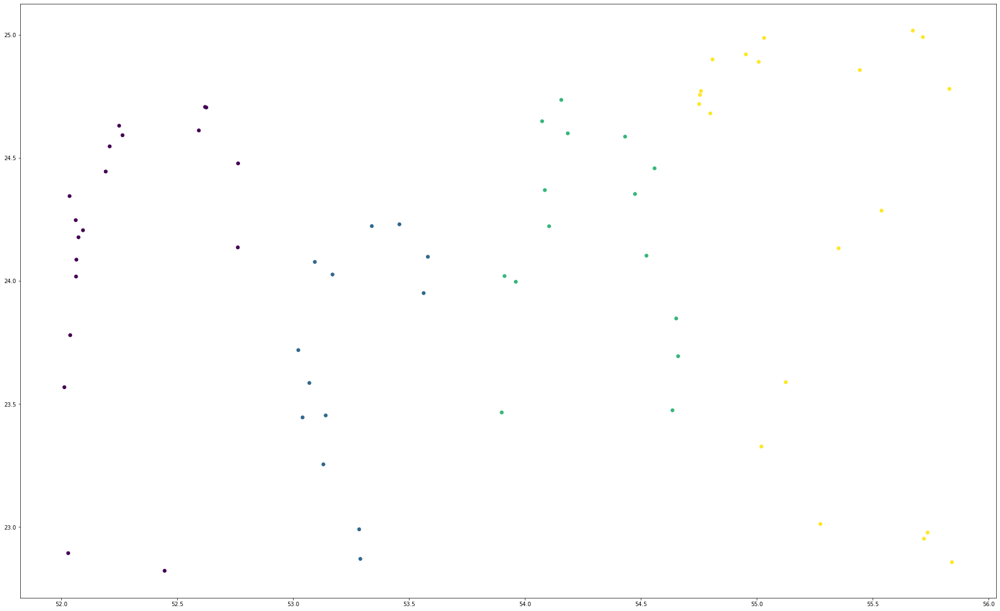

In [5]:
points = plt.scatter(latlong['x'], latlong['y'], c=latlong['label']).figure.set_size_inches(32,20)

### Load and manage the spatial data to prepare it for future processing

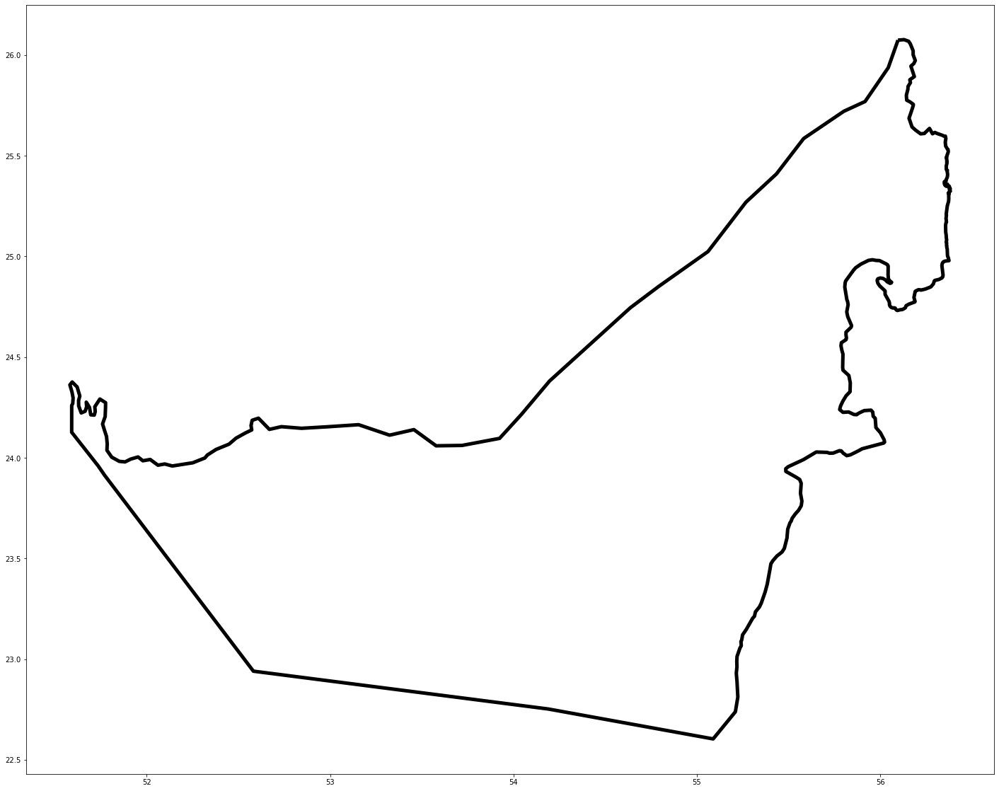

In [6]:
# Boundaries UAE 
stateFile = gpd.read_file(state)       # Load the shapefile of UAE
stateFile=stateFile.to_crs("EPSG:4326") # choose and set the correct coordinate system used in the shapefile
stategeo = stateFile.geometry.union_all(method='unary') #Extract the geometry to be used as a mask later on
stateplot=stateFile.plot( color='none',  edgecolor='black',linewidth=5).figure.set_size_inches(32,20)

## Visualize Clustering Output

### Run the Voronoi_regions_plot function with the parameters:

NOT Showing Points  
NOT Showing Basemap  
NOT Applying Mask  

In [7]:
map4=geoz.voronoi_regions_plot(latlong, 'x', 'y', 'label')

### Run the Voronoi_regions_plot function with the parameters:

Showing Points  
Showing Basemap  
NOT Applying Mask  

In [8]:
# Load the shapefile of UAE and save it to a variable to use it within the voronoi_regions_plot function
stateplot=stateFile.plot( color='none',  edgecolor='black',linewidth=5)

map4=geoz.voronoi_regions_plot(latlong, 'x', 'y', 'label', show_points=True, ax= stateplot)

### Run the Voronoi_regions_plot function with the parameters:

Showing Points  
Showing Basemap  
Applying Mask  

In [11]:
# Load the shapefile of UAE and save it to a variable to use it within the mlx_plot function
stateplot=stateFile.plot( color='none',  edgecolor='black',linewidth=5)

map4=geoz.voronoi_regions_plot(latlong, 'x', 'y', 'label', show_points=True, ax= stateplot, edgecolors='blue', mask=stategeo)

## Save the output map

In [12]:
map4.figure.savefig('voronoi_regions_plot_Minimum.png') # The name and extention can be anything the user wants, refer to matplotlib for acceptable formats

## Comparision between mapping the full dataset VS mapping only 1% of the dataset:

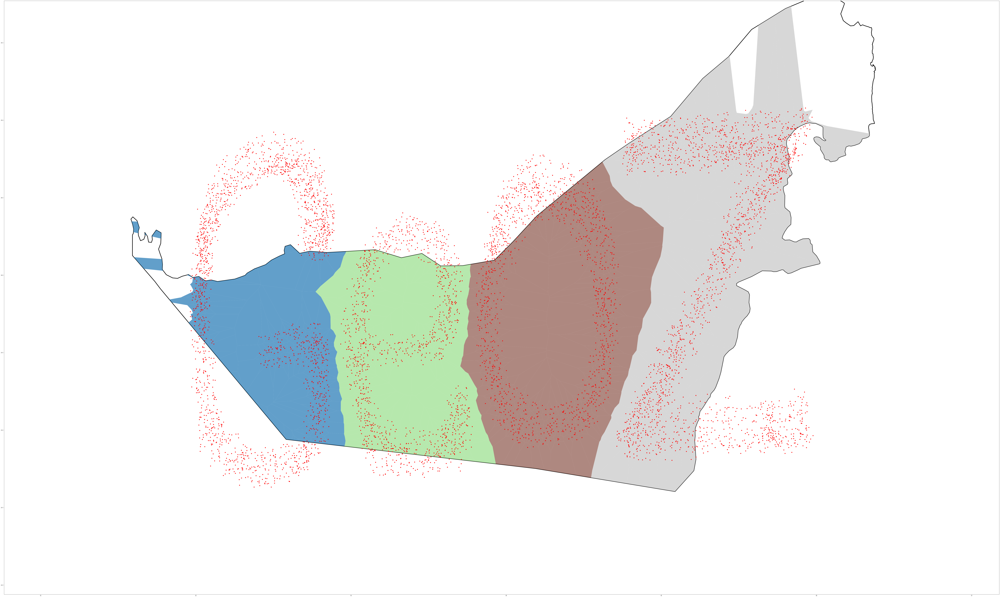

In [ ]:
# This is the original figure with ~7000 samples
# The samples are highlighted with red color

In [ ]:
# This is the resulting figure when using only 68 samples
# The samples are highlighted with red color but are hard to see